In [1]:
%cd ../..

/home/eli/AnacondaProjects/epych


In [2]:
%env DASK_LOGGING__DISTRIBUTED=CRITICAL
%env SPYTMPDIR=/mnt/data/tmp_storage
%env SPYLOGLEVEL=CRITICAL
%env SPYPARLOGLEVEL=CRITICAL

env: DASK_LOGGING__DISTRIBUTED=CRITICAL
env: SPYTMPDIR=/mnt/data/tmp_storage
env: SPYLOGLEVEL=CRITICAL
env: SPYPARLOGLEVEL=CRITICAL


In [3]:
import collections
import functools
import itertools
import logging
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import quantities as pq

import epych
from epych.statistics import alignment, spectrum

[striatum:40510] shmem: mmap: an error occurred while determining whether or not /tmp/ompi.striatum.1000/jf.0/2391998464/shared_mem_cuda_pool.striatum could be created.
[striatum:40510] create_and_attach: unable to create shared memory BTL coordinating structure :: size 134217728 


In [4]:
%matplotlib inline
# %load_ext autoreload
# %autoreload 2

In [5]:
logging.basicConfig(level=logging.INFO)

In [6]:
SECOND_ONSET = pq.Quantity(-2.0) * pq.second
SECOND_OFFSET = pq.Quantity(-1.5) * pq.second
ADAPTED_ONSET = pq.Quantity(-1.0) * pq.second
ADAPTED_OFFSET = pq.Quantity(-0.5) * pq.second
ODDBALL_ONSET = pq.Quantity(-1.9017372477960602e-14) * pq.second
ODDBALL_OFFSET = pq.Quantity(0.5004545430388676) * pq.second
OFFSET = pq.Quantity(0.020) * pq.second
EVENTS = {
    "Oddball": (ODDBALL_ONSET.magnitude, 'lightgreen'),
    "Offset": (ODDBALL_OFFSET.magnitude, 'red'),
}
ADAPTED_EVENTS = {
    "Offset": (ADAPTED_OFFSET.magnitude, 'red'),
    "Oddball": (ODDBALL_ONSET.magnitude, 'lightgreen'),
}
FREQ_RANGE = (spectrum.THETA_BAND[0].magnitude, spectrum.GAMMA_BAND[1].magnitude)
FORCE_RECOMPUTE = False

In [7]:
CONDITIONS = ["lonaive", "go_gloexp", "go_seqctl", "lo_gloexp", "lo_rndctl", "igo_seqctl"]
LAMINAE = {
    'L2/3': lambda loc: "2/3" in loc,
    'L4': lambda loc: "4" in loc,
    'L5/6': lambda loc: "5" in loc or "6" in loc,
    'L1/6': lambda loc: "1" in loc or "6" in loc,
}

In [8]:
BANDS = {
    "Theta": spectrum.THETA_BAND,
    "Alpha/Beta": spectrum.ALPHA_BETA_BAND,
    "Gamma": spectrum.LOW_GAMMA_BAND,
}
BAND_NAMES = {
    "Theta": "theta",
    "Alpha/Beta": "alphabeta",
    "Gamma": "gamma"
}

In [9]:
area_titles = {
    "VISal": "AL",
    "VISam": "AM",
    "VISl": "LM",
    "VISp": "V1",
    "VISpm": "PM",
    "VISrl": "RL",
}
def stattitle(name, stat, layer=None):
    if name in area_titles:
        result = area_titles[name]
    else:
        result = name
    if layer is not None:
        return result + " (%s)" % layer
    return result
anatomical_areas = ['VISp', 'VISl', 'VISrl', 'VISal', 'VISpm', 'VISam']

In [10]:
def initialize_spectrum(key, signal, path=None):
    area = os.path.commonprefix([loc for loc in signal.channels.location])
    return epych.statistics.spectrum.Spectrogram(signal.df, signal.channels, signal.f0, taper="hann", path=path + "/" + key, time_window=0.200)

In [11]:
def baselined_oscillatory(spectrogram):
    return spectrogram.oscillatory().baseline(-0.250 * pq.second, -0.05 * pq.second, decibels=True)

def spectrogram_4minus3(spectrogram):
    diff = spectrogram[(ODDBALL_ONSET - OFFSET).magnitude:(ODDBALL_OFFSET + OFFSET).magnitude] - spectrogram[(ADAPTED_ONSET - OFFSET).magnitude:(ADAPTED_OFFSET + OFFSET).magnitude]
    return diff.shift_timestamps(-OFFSET)

def oscillatory_4minus3(spectrogram):
    return spectrogram_4minus3(baselined_oscillatory(spectrogram))

In [12]:
full_tfrs = {}
spectrograms = {}

In [13]:
for cond in CONDITIONS:
    cond_path = "/mnt/data/000253/grand_spectrogram_downsample4_%s" % cond
    raw_spectrograms = epych.statistic.Summary.unpickle(cond_path, epych.statistics.spectrum.Spectrogram)
    full_tfrs[cond] = raw_spectrograms.results().smap(baselined_oscillatory)
    spectrograms[cond] = full_tfrs[cond].smap(spectrogram_4minus3)
    del raw_spectrograms
    logging.info("Loaded LFP spectrograms across condition %s" % cond)

INFO:root:Loaded LFP spectrograms across condition lonaive
INFO:root:Loaded LFP spectrograms across condition go_gloexp
INFO:root:Loaded LFP spectrograms across condition go_seqctl
INFO:root:Loaded LFP spectrograms across condition lo_gloexp
INFO:root:Loaded LFP spectrograms across condition lo_rndctl
INFO:root:Loaded LFP spectrograms across condition igo_seqctl


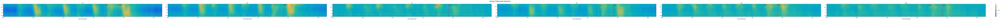

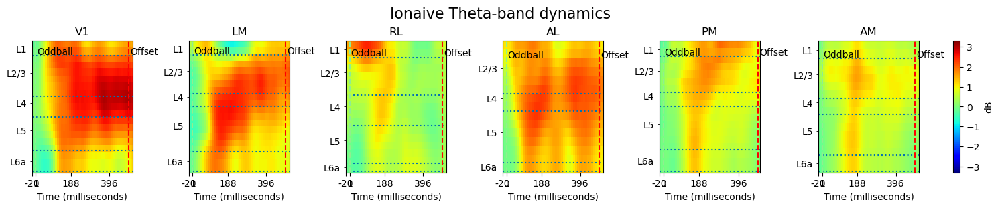

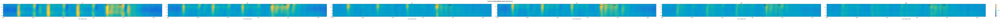

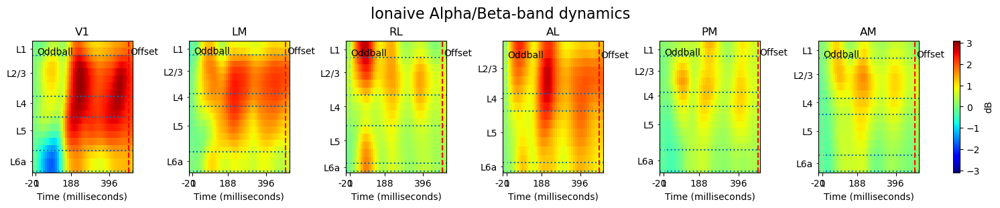

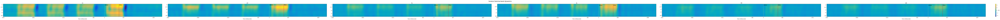

...

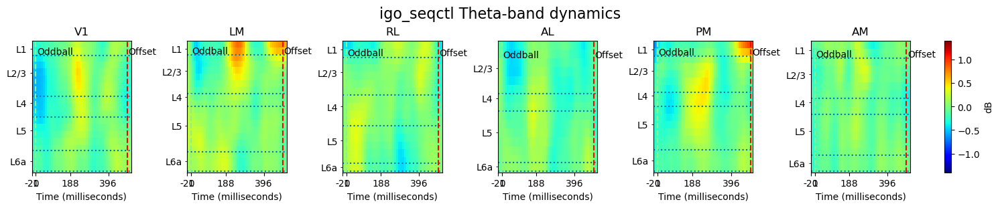

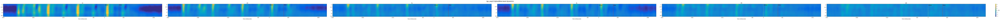

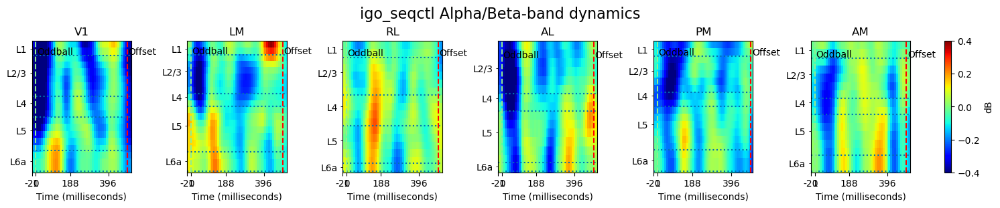

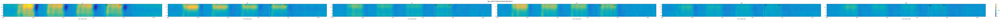

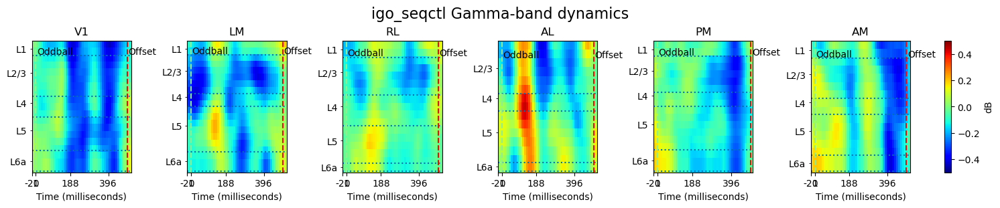

In [14]:
for cond in CONDITIONS:
    for band, freqs in BANDS.items():
        band_powers = full_tfrs[cond].erp().smap(lambda tfr: tfr.band_power(freqs[0].magnitude, freqs[1].magnitude))
        band_powers.plot(signals=anatomical_areas, sigtitle=stattitle,
                         title="%s %s-band dynamics" % (cond, band),
                         figure="oscillatory_laminar_%s_%s.pdf" % (cond, BAND_NAMES[band]), **EVENTS)

        band_powers = spectrograms[cond].erp().smap(lambda tfr: tfr.band_power(freqs[0].magnitude, freqs[1].magnitude))
        band_powers.plot(signals=anatomical_areas, sigtitle=stattitle, cmap="jet",
                         title="%s %s-band dynamics" % (cond, band),
                         figure="oscillatory_laminar_%s_%s_4-3.pdf" % (cond, BAND_NAMES[band]), **EVENTS)

In [15]:
CONTRASTS = [("go_contrast", "go_gloexp", "go_seqctl"), ("ssa", "lo_gloexp", "igo_seqctl"), ("dd", "lo_rndctl", "lonaive")]

In [16]:
CONTRAST_TITLES = {
    "go_contrast": "Global Oddball vs AAAA Control",
    "ssa": "Local Oddball vs BBBB Control",
    "dd": "AAAB Random Control vs AAAB Naive"
}
def contrast_stattitle(contrast, name, stat, layer=None):
    suffix = " (%s, %s)" % (CONTRAST_TITLES[contrast], layer) if layer else " (%s)" % CONTRAST_TITLES[contrast]
    return stattitle(name, stat) + suffix

In [17]:
diffs = {name: {laminae: None for laminae in LAMINAE} for (name, _, _) in CONTRASTS}

In [18]:
def area_name(probe, signals):
    return probe

In [19]:
for (name, condl, condr) in CONTRASTS:
    diff_signals = {}
    for area in spectrograms[condl].signals.keys():
        tfr_l, tfr_r = spectrograms[condl].signals[area],  spectrograms[condr].signals[area]
        diff_signals[area] = tfr_l.evoked() - tfr_r.evoked()
    diffs[name] = epych.recording.EvokedSampling(epych.recording.empty_intervals(), epych.recording.empty_trials(),
                                                 epych.recording.default_units(), **diff_signals)
    logging.info("Double-subtracted spectrograms for %s" % (name))

INFO:root:Double-subtracted spectrograms for go_contrast
INFO:root:Double-subtracted spectrograms for ssa
INFO:root:Double-subtracted spectrograms for dd


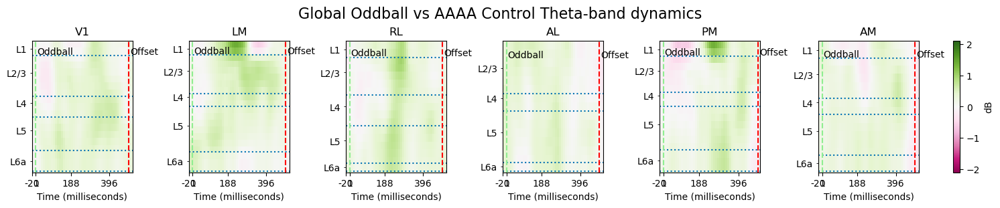

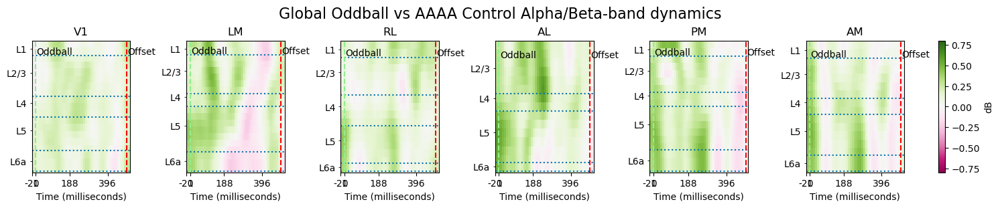

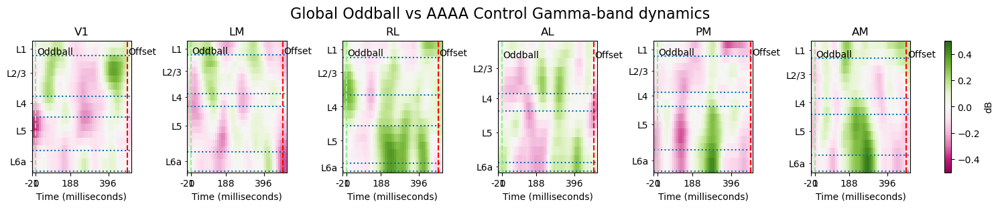

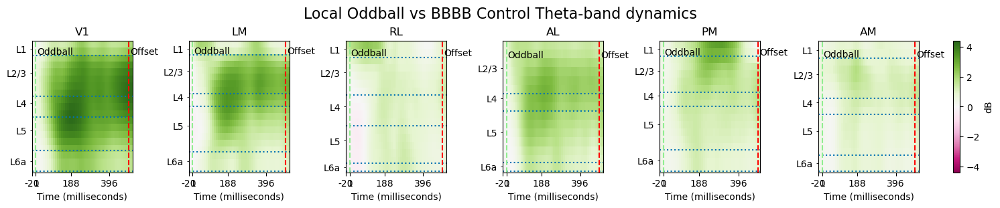

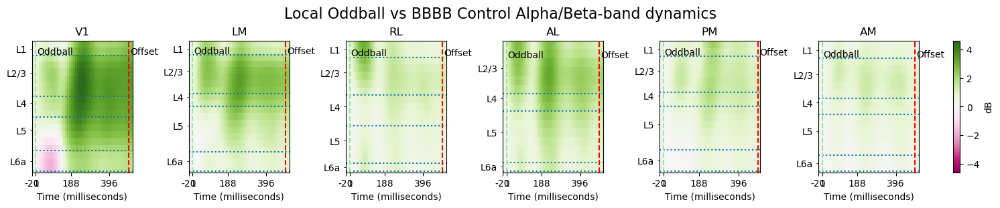

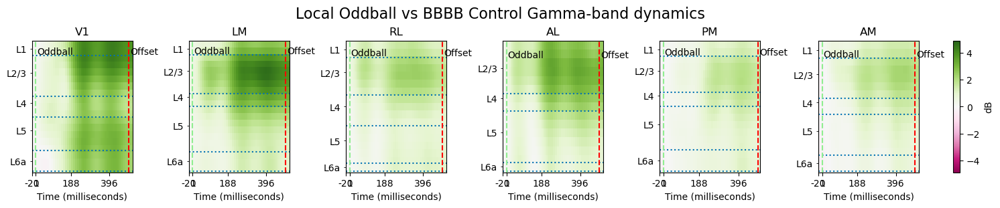

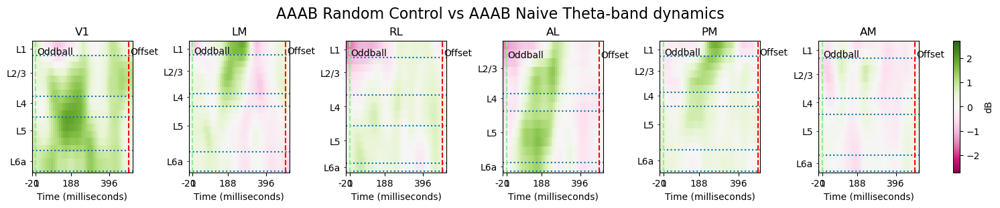

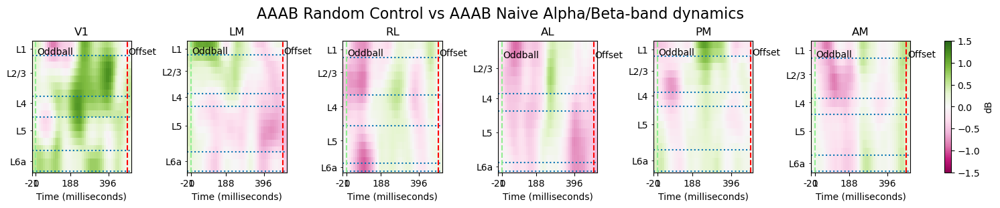

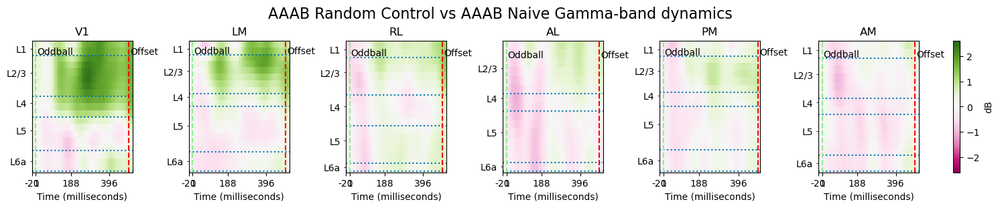

In [20]:
for (name, _, _) in CONTRASTS:
    for band, freqs in BANDS.items():
        band_powers = diffs[name].smap(lambda tfr: tfr.band_power(freqs[0].magnitude, freqs[1].magnitude))
        band_powers.plot(signals=anatomical_areas, sigtitle=stattitle, cmap='PiYG',
                         title="%s %s-band dynamics" % (CONTRAST_TITLES[name], band),
                         figure="oscillatory_laminar_%s_%s_4-3.pdf" % (name, BAND_NAMES[band]), **EVENTS)